<a href="https://colab.research.google.com/github/PacktPublishing/Hands-On-Computer-Vision-with-PyTorch/blob/master/Chapter07/Training_Fast_R_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Two-stage Detector - Fast R-CNN

**Ross Girshich, "Fast R-CNN", 2015**

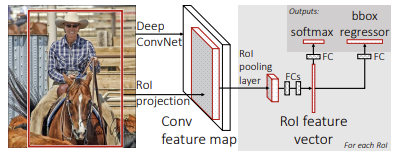
<center>Fast R-CNN 논문 일부</center>

***Fast R-CNN(Fast Region-based Convolution Neural Network)***

### 진행 방법

데이터 로드 -> Region Proposal -> CNN -> ROI -> classification and bbox regressor

### 패키지 불러오기

In [127]:
#!pip install -q --upgrade selectivesearch torch_snippets
from torch_snippets import *
import selectivesearch
from torchvision import transforms, models, datasets
from torch_snippets import Report
from torchvision.ops import nms
device = 'cuda' if torch.cuda.is_available() else 'cpu'
#device='cpu'

### 데이터 불러오기

R-CNN과 같은 데이터셋을 이용하여 Fast R-CNN에 적용하여 결과를 살펴보자.

In [128]:
IMAGE_ROOT = './data/images/images'
DF_RAW = pd.read_csv('./data/df.csv')
print(DF_RAW.head())

            ImageID  Source LabelName  Confidence      XMin      XMax  \
0  0000599864fd15b3  xclick       Bus           1  0.343750  0.908750   
1  00006bdb1eb5cd74  xclick     Truck           1  0.276667  0.697500   
2  00006bdb1eb5cd74  xclick     Truck           1  0.702500  0.999167   
3  00010bf498b64bab  xclick       Bus           1  0.156250  0.371250   
4  00013f14dd4e168f  xclick       Bus           1  0.287500  0.999375   

       YMin      YMax  IsOccluded  IsTruncated  ...  IsDepiction  IsInside  \
0  0.156162  0.650047           1            0  ...            0         0   
1  0.141604  0.437343           1            0  ...            0         0   
2  0.204261  0.409774           1            1  ...            0         0   
3  0.269188  0.705228           0            0  ...            0         0   
4  0.194184  0.999062           0            1  ...            0         0   

   XClick1X  XClick2X  XClick3X  XClick4X  XClick1Y  XClick2Y  XClick3Y  \
0  0.421875  0.34

In [129]:
DF_RAW.shape

(24062, 21)

데이터 확인

- **Open Images class**<br>
csv 파일에서 필요한 부분인 ImageID, XMin, YMin, XMax, YMax, LabelName 열을 가져오는 과정이다. 이때, ImageID는 여러 행이 있을 수 있으니 중복을 제거하고 나머지 열의 행들을 가져와 list 형태로 만들어 image, boxes, classes, image_path를 return 한다.

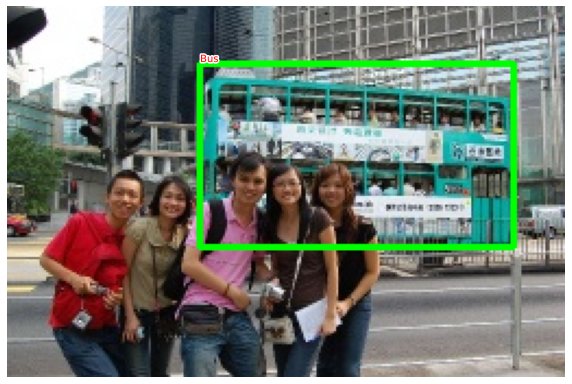

'\n(XMin,Ymin)-> 이미지 좌측 하단 좌표의 정규화 값\n(XMax,Ymax)-> 이미지 우측 상단 좌표의 정규화 값\n네 값으로 bb 생성\n'

In [165]:
class OpenImages(Dataset):
    def __init__(self, df, image_folder=IMAGE_ROOT):
        self.root = image_folder
        self.df = df 
        self.unique_images = df['ImageID'].unique()
    def __len__(self): return len(self.unique_images)
    def __getitem__(self, ix):
        image_id = self.unique_images[ix] #파일 고유명
        image_path = f'{self.root}/{image_id}.jpg' #이미지의 전체경로
        #print(image_id)
        #print(image_path)
        image = cv2.imread(image_path, 1)[...,::-1] # convert BGR to RGB
        #print(len(image))
        #print(image)
        h, w, _ = image.shape # h=높이, w= 너비 _=채널(depth)
        #print(h,w,_)
        df = self.df.copy() #이미지 변형방지를 위한 복사
        df = df[df['ImageID'] == image_id] 
        boxes = df['XMin,YMin,XMax,YMax'.split(',')].values #csv 에서 정규화 되어있는 값 가져오기
        boxes = (boxes * np.array([w,h,w,h])).astype(np.uint16).tolist() #정규화된 값 -> 정수->리스트 담기
        classes = df['LabelName'].values.tolist() #분류된 box의 라벨명->리스트
        #print(classes) 
        return image, boxes, classes, image_path
ds = OpenImages(df=DF_RAW)
im, bbs, clss, _ = ds[0] #image(RGB), boxes(여러개), lablename, path
#print(im)
#print(type(bbs))
#print(ds[2])
show(im, bbs=bbs, texts=clss, sz=10)

"""
(XMin,Ymin)-> 이미지 좌측 하단 좌표의 정규화 값
(XMax,Ymax)-> 이미지 우측 상단 좌표의 정규화 값
네 값으로 bb 생성
"""

### Region Proposal 구하기

함수 정의

- **extra_candidates() 함수**<br>
selective search를 통해 region proposal bounding box 좌표를 찾아낸 후 특정 조건을 만족하면 좌표를 list 형태인 candidates에 넣어 return 해주는 함수

In [78]:
def extract_candidates(img): 
    img_lbl, regions = selectivesearch.selective_search(img, scale=200, min_size=100)
    img_area = np.prod(img.shape[:2])#np.prod ->요소들의 곱 반환
    #print(img_area)
    #print(img.shape[:2]) -> W,H -> W*H
    candidates = []
    for r in regions:
        if r['rect'] in candidates: continue
        if r['size'] < (0.05*img_area): continue # 너무 작은 값 pass
        if r['size'] > (1*img_area): continue #너무 큰 값 pass
        x, y, w, h = r['rect']
        #print(x,y,w,h)
        candidates.append(list(r['rect']))
    return candidates

- **extract_iou() 함수**<br>
iou를 계산해주는 함수

In [76]:
def extract_iou(boxA, boxB, epsilon=1e-5):
    #두 영역의 교집합 구하기
    x1 = max(boxA[0], boxB[0])
    y1 = max(boxA[1], boxB[1])
    x2 = min(boxA[2], boxB[2])
    y2 = min(boxA[3], boxB[3])
    width = (x2 - x1)
    height = (y2 - y1)
    if (width<0) or (height <0):
        return 0.0
    area_overlap = width * height #교집합 넓이
    area_a = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1]) #a의 넓이
    area_b = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1]) #b의 넓이
    area_combined = area_a + area_b - area_overlap #합집합 넓이
    iou = area_overlap / (area_combined+epsilon) # 교집합/합집합 ->비율
    return iou

In [90]:
help(show)

Help on function show in module torch_snippets.loader:

show(img=None, ax=None, title=None, sz=None, bbs=None, confs=None, texts=None, bb_colors=None, cmap='gray', grid=False, save_path=None, text_sz=10, df=None, pts=None, conns=None, **kwargs)
    show an image



Best IoU: 0.7388727687085425


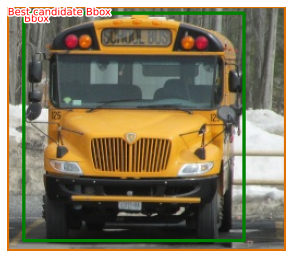

In [166]:
#예시
(im, bbs, labels, fpath) = ds[12]
H, W, _ = im.shape
candidates = extract_candidates(im)
candidates = np.array([(x,y,x+w,y+h) for x,y,w,h in candidates])  # ds에서 Region proposal된 모든 bbs 가져옴

ious, rois, clss, deltas, best_ious = [], [], [], [], []
temp_best_bbs = []
ious = np.array([[extract_iou(candidate, _bb_) for candidate in candidates] for _bb_ in bbs]).T

for jx, candidate in enumerate(candidates):
    cx,cy,cX,cY = candidate
    candidate_ious = ious[jx]  #Region proposal된 모든 bbs 반복
    #print(candidate_ious)
    best_iou_at = np.argmax(candidate_ious)  #best candidate iou is taken (index) ~ 항상 0나옴
    best_iou = candidate_ious[best_iou_at]   #gets the best score here
    #print(best_iou)
    best_ious.append(best_iou)
    best_bb = _x,_y,_X,_Y = bbs[best_iou_at] # gets the target label bounding box where there is the highest iou
    #print(best_bb)
    temp_best_bbs.append(best_bb)
    if best_iou > 0.3: clss.append(labels[best_iou_at]) # 30퍼센트이상 포함되어야함
    else : clss.append('background')
    delta = np.array([_x-cx, _y-cy, _X-cX, _Y-cY]) / np.array([W,H,W,H])  #값 정규화
    deltas.append(delta)
    rois.append(candidate / np.array([W,H,W,H]))

best_ious_at = np.argmax(best_ious)
print("Best IoU:", best_ious[best_ious_at])


best_candidate = candidates[best_ious_at]
best_bbs = temp_best_bbs[best_ious_at]

# Example of df[15]
candidates = extract_candidates(im)
show(im, bbs = [best_bbs, best_candidate], confs= [0,0.5], texts = ['Bbox', 'Best candidate Bbox'])

(51, 4)
<class 'list'>


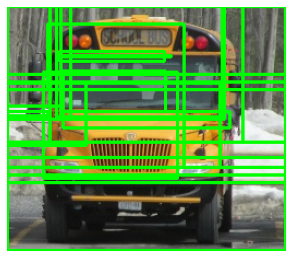

In [169]:
# Region Proposal 결과
candidates = extract_candidates(im)
print(np.shape(candidates))
print(type(candidates))
show(im, bbs = candidates)

전체 사진에 적용

In [157]:
FPATHS, GTBBS, CLSS, DELTAS, ROIS, IOUS = [], [], [], [], [], []
#N = 1
N = 500
for ix, (im, bbs, labels, fpath) in enumerate(ds): 
    if(ix==N):
        break
    H, W, _ = im.shape #이미지의 높이,너비,채널
    #print(H,W,_)
    #사용함수 : extract_candidates(img)
    candidates = extract_candidates(im)  
    #print(candidates)
    candidates = np.array([(x,y,x+w,y+h) for x,y,w,h in candidates]) #x,y ->bb의 좌상단 좌표
    #print(candidates)
    ious, rois, clss, deltas = [], [], [], []
    #사용함수 : extract_iou(boxA, boxB, epsilon=1e-5)
    ious = np.array([[extract_iou(candidate, _bb_) for candidate in candidates] for _bb_ in bbs]).T
    #print(ious)
    for jx, candidate in enumerate(candidates):
        cx,cy,cX,cY = candidate
        #print(cx,cy,cX,cY)
        candidate_ious = ious[jx]
        best_iou_at = np.argmax(candidate_ious)
        best_iou = candidate_ious[best_iou_at]
        best_bb = _x,_y,_X,_Y = bbs[best_iou_at]
        if best_iou > 0.3: clss.append(labels[best_iou_at])
        else : clss.append('background')
        delta = np.array([_x-cx, _y-cy, _X-cX, _Y-cY]) / np.array([W,H,W,H]) #정규화
        deltas.append(delta)
        rois.append(candidate / np.array([W,H,W,H]))
    FPATHS.append(fpath)
    IOUS.append(ious)
    ROIS.append(rois)
    CLSS.append(clss)
    DELTAS.append(deltas)
    GTBBS.append(bbs)
FPATHS = [f'{IMAGE_ROOT}/{stem(f)}.jpg' for f in FPATHS] 
FPATHS, GTBBS, CLSS, DELTAS, ROIS = [item for item in [FPATHS, GTBBS, CLSS, DELTAS, ROIS]]

In [105]:
targets = pd.DataFrame(flatten(CLSS), columns=['label'])
label2target = {l:t for t,l in enumerate(targets['label'].unique())}
target2label = {t:l for l,t in label2target.items()}
background_class = label2target['background']


print("The label to target values dictionary formed is:" ,label2target)

The label to target values dictionary formed is: {'Bus': 0, 'background': 1, 'Truck': 2}


이미지 프로세싱 함수 정의

- **preprocess_image() 함수**<br>
image를 tensor로 바꿔주고 normalization해주는 함수

- **decode() 함수**<br>
🤪다시 돌린다 ?

In [106]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
def preprocess_image(img):
    #RGB to BGR
    img = torch.tensor(img).permute(2,0,1)
    img = normalize(img)
    return img.to(device).float()
def decode(_y):
    _, preds = _y.max(-1)
    return preds

In [113]:
a = np.array([3,4,5,7,4,5])
a.max(-1)

7

### Custom Dataset

In [130]:
class FRCNNDataset(Dataset):
    def __init__(self, fpaths, rois, labels, deltas, gtbbs):
        self.fpaths = fpaths
        self.gtbbs = gtbbs
        self.rois = rois
        self.labels = labels
        self.deltas = deltas
    def __len__(self): return len(self.fpaths)
    def __getitem__(self, ix):
        fpath = str(self.fpaths[ix])
        image = cv2.imread(fpath, 1)[...,::-1] # convert BGR to RGB
        gtbbs = self.gtbbs[ix]
        rois = self.rois[ix]
        labels = self.labels[ix]
        deltas = self.deltas[ix]
        assert len(rois) == len(labels) == len(deltas), f'{len(rois)}, {len(labels)}, {len(deltas)}'
        return image, rois, labels, deltas, gtbbs, fpath

    def collate_fn(self, batch):
        input, rois, rixs, labels, deltas = [], [], [], [], []
        for ix in range(len(batch)):
            image, image_rois, image_labels, image_deltas, image_gt_bbs, image_fpath = batch[ix]
            image = cv2.resize(image, (224,224))
            input.append(preprocess_image(image/255.)[None])
            rois.extend(image_rois)
            rixs.extend([ix]*len(image_rois))
            labels.extend([label2target[c] for c in image_labels])
            deltas.extend(image_deltas)
        input = torch.cat(input).to(device)
        rois = torch.Tensor(rois).float().to(device)
        rixs = torch.Tensor(rixs).float().to(device)
        labels = torch.Tensor(labels).long().to(device)
        deltas = torch.Tensor(deltas).float().to(device)
        return input, rois, rixs, labels, deltas

In [115]:
# Data의 90% ->Train 나머지 Test
n_train = 9*len(FPATHS)//10
train_ds = FRCNNDataset(FPATHS[:n_train], ROIS[:n_train], CLSS[:n_train], DELTAS[:n_train], GTBBS[:n_train])
test_ds = FRCNNDataset(FPATHS[n_train:], ROIS[n_train:], CLSS[n_train:], DELTAS[n_train:], GTBBS[n_train:])

from torch.utils.data import TensorDataset, DataLoader
train_loader = DataLoader(train_ds, batch_size=2, collate_fn=train_ds.collate_fn, drop_last=True)
test_loader = DataLoader(test_ds, batch_size=2, collate_fn=test_ds.collate_fn, drop_last=True)

In [116]:
for input, rois, rixs, labels, deltas in train_loader:
    print(input.shape)
    print(labels) # labels 값이 각 batch_size마다 다름
    break

torch.Size([2, 3, 224, 224])
tensor([0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1,
        1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2,
        1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')


### 모형 정의

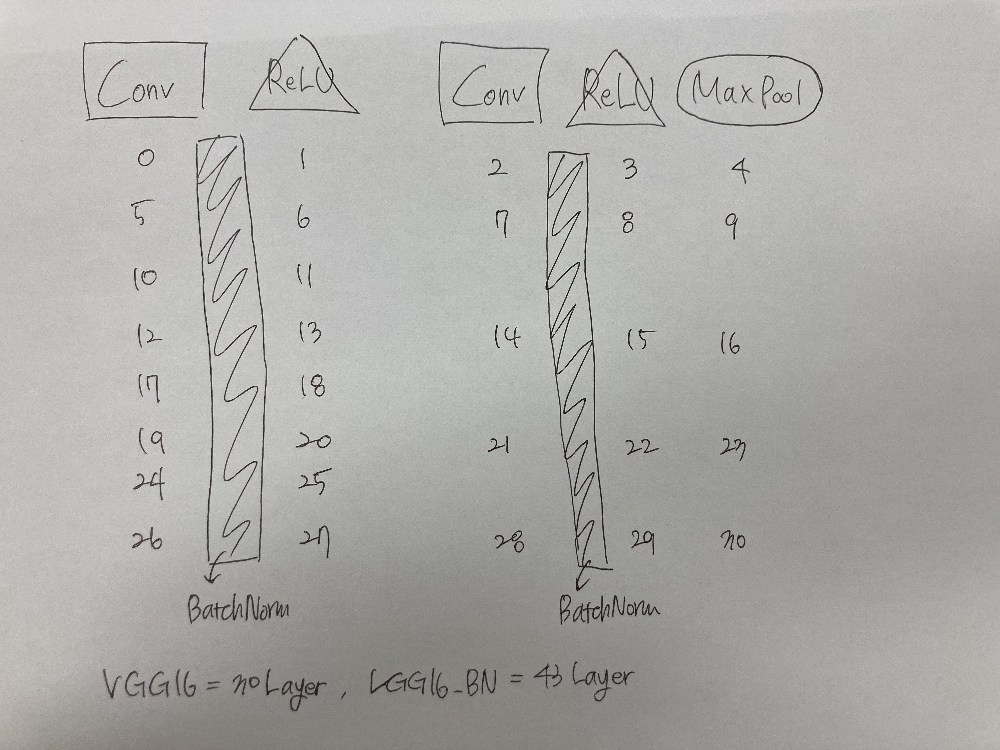

backbone으로 VGG16_BN 모형을 사용하였다. 이때, 기존 VGG16과 VGG16_BN의 차이점을 이야기하면 다음 사진에서 찾아볼 수 있다.

- VGG16 = 30 Layers<br>
- VGG16_BN = 43 Layers<br>

- **FRCNN class**
cls_score, bbox가 output으로 출력되고 clac_loss는 3가지 값이 출력된다.
- detection_loss + self.lmb * regression_loss
- detection_loss.detach()
- regression_loss.detach()

In [117]:
from torchvision.ops import RoIPool
class FRCNN(nn.Module):
    def __init__(self):
        super().__init__()
        rawnet = torchvision.models.vgg16_bn(pretrained=True)#backbone
        for param in rawnet.features.parameters():
            param.requires_grad = True
        self.seq = nn.Sequential(*list(rawnet.features.children())[:-1])
        self.roipool = RoIPool(7, spatial_scale=14/224)
        feature_dim = 512*7*7
        self.cls_score = nn.Linear(feature_dim, len(label2target))
        self.bbox = nn.Sequential(
              nn.Linear(feature_dim, 512),
              nn.ReLU(),
              nn.Linear(512, 4),
              nn.Tanh(),
            )
        self.cel = nn.CrossEntropyLoss()
        self.sl1 = nn.L1Loss()
    def forward(self, input, rois, ridx):
        res = input
        res = self.seq(res)
        rois = torch.cat([ridx.unsqueeze(-1), rois*224], dim=-1)
        res = self.roipool(res, rois)
        feat = res.view(len(res), -1)
        cls_score = self.cls_score(feat)
        bbox = self.bbox(feat) # .view(-1, len(label2target), 4)
        return cls_score, bbox
    def calc_loss(self, probs, _deltas, labels, deltas):
        detection_loss = self.cel(probs, labels)
        ixs, = torch.where(labels != background_class)
        _deltas = _deltas[ixs]
        deltas = deltas[ixs]
        self.lmb = 10.0
        if len(ixs) > 0:
            regression_loss = self.sl1(_deltas, deltas)
            return detection_loss + self.lmb * regression_loss, detection_loss.detach(), regression_loss.detach()
        else:
            regression_loss = 0
            return detection_loss + self.lmb * regression_loss, detection_loss.detach(), regression_loss

In [118]:
frcnn = FRCNN().to(device)
print(frcnn)

FRCNN(
  (seq): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU(inplace=True)
    (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU(inplace=True)
    (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (14): Conv2d(128, 256, k

### 학습

함수 정의

- **train_batch() 함수**<br>
for문 안에서 train_batch() 함수를 이용하여 **loss** (detection_loss + self.lmb x regression_loss), **loc_loss** (detection_loss.detach()), **regr_loss** (regression_loss.detach()),
 **accs** 를 return 한다.

In [137]:
def train_batch(inputs, model, optimizer, criterion):
    input, rois, rixs, clss, deltas = inputs
    model.train()
    optimizer.zero_grad()
    _clss, _deltas = model(input, rois, rixs)
    loss, loc_loss, regr_loss = criterion(_clss, _deltas, clss, deltas)
    accs = clss == decode(_clss)
    loss.backward()
    optimizer.step()
    return loss.detach(), loc_loss, regr_loss, accs.cpu().numpy()

- **validate_batch() 함수**<br>
for문 안에서 validate_batch() 함수를 이용하여 **loss** (detection_loss + self.lmb x regression_loss), **loc_loss** (detection_loss.detach()), **regr_loss** (regression_loss.detach()),
 **accs** 를 return 한다. 

In [135]:
def validate_batch(inputs, model, criterion):
    input, rois, rixs, clss, deltas = inputs
    with torch.no_grad():
        model.eval()
        _clss,_deltas = model(input, rois, rixs)
        loss, loc_loss, regr_loss = criterion(_clss, _deltas, clss, deltas)
        _clss = decode(_clss)
        accs = clss == _clss
    return _clss, _deltas, loss.detach(), loc_loss, regr_loss, accs.cpu().numpy()

필요 파라미터 정의

In [141]:
frcnn = FRCNN().to(device)
criterion = frcnn.calc_loss
optimizer = optim.SGD(frcnn.parameters(), lr=1e-3)

n_epochs = 10

epoch 만큼 학습

EPOCH: 1.000	trn_loss: 1.965	trn_loc_loss: 0.858	trn_regr_loss: 0.111	trn_acc: 0.652	val_loss: 1.506	val_loc_loss: 0.662	val_regr_loss: 0.084	val_acc: 0.762	(4.41s - 39.65s remaining)
EPOCH: 2.000	trn_loss: 1.442	trn_loc_loss: 0.631	trn_regr_loss: 0.081	trn_acc: 0.762	val_loss: 1.487	val_loc_loss: 0.617	val_regr_loss: 0.087	val_acc: 0.757	(8.89s - 35.57s remaining)
EPOCH: 3.000	trn_loss: 1.144	trn_loc_loss: 0.515	trn_regr_loss: 0.063	trn_acc: 0.810	val_loss: 1.432	val_loc_loss: 0.599	val_regr_loss: 0.083	val_acc: 0.758	(13.14s - 30.66s remaining)
EPOCH: 4.000	trn_loss: 0.980	trn_loc_loss: 0.429	trn_regr_loss: 0.055	trn_acc: 0.850	val_loss: 1.398	val_loc_loss: 0.594	val_regr_loss: 0.080	val_acc: 0.763	(17.58s - 26.37s remaining)
EPOCH: 5.000	trn_loss: 0.854	trn_loc_loss: 0.365	trn_regr_loss: 0.049	trn_acc: 0.881	val_loss: 1.403	val_loc_loss: 0.593	val_regr_loss: 0.081	val_acc: 0.764	(22.06s - 22.06s remaining)
EPOCH: 6.000	trn_loss: 0.752	trn_loc_loss: 0.314	trn_regr_loss: 0.044	trn_acc

100%|██████████| 111/111 [00:00<00:00, 3299.61it/s]


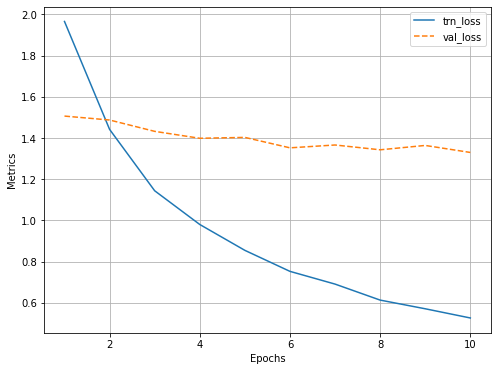

In [142]:
log = Report(n_epochs)
for epoch in range(n_epochs):

    _n = len(train_loader)
    for ix, inputs in enumerate(train_loader):
        loss, loc_loss, regr_loss, accs = train_batch(inputs, frcnn, 
                                                      optimizer, criterion)
        pos = (epoch + (ix+1)/_n)
        log.record(pos, trn_loss=loss.item(), trn_loc_loss=loc_loss, 
                   trn_regr_loss=regr_loss, 
                   trn_acc=accs.mean(), end='\r')
        
    _n = len(test_loader)
    for ix,inputs in enumerate(test_loader):
        _clss, _deltas, loss, \
        loc_loss, regr_loss, accs = validate_batch(inputs, 
                                                frcnn, criterion)
        pos = (epoch + (ix+1)/_n)
        log.record(pos, val_loss=loss.item(), val_loc_loss=loc_loss, 
                val_regr_loss=regr_loss, 
                val_acc=accs.mean(), end='\r')
        
    log.report_avgs(epoch+1)

# Plotting training and validation metrics
log.plot_epochs('trn_loss,val_loss'.split(','))

### Test

In [143]:
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.patches as mpatches
from torchvision.ops import nms
from PIL import Image
def test_predictions(filename):
    img = cv2.resize(np.array(Image.open(filename)), (224,224))
    candidates = extract_candidates(img)
    candidates = [(x,y,x+w,y+h) for x,y,w,h in candidates]
    input = preprocess_image(img/255.)[None]
    rois = [[x/224,y/224,X/224,Y/224] for x,y,X,Y in candidates]
    rixs = np.array([0]*len(rois))
    rois, rixs = [torch.Tensor(item).to(device) for item in [rois, rixs]]
    with torch.no_grad():
        frcnn.eval() ##eval() -> gradient 고정
        probs, deltas = frcnn(input, rois, rixs)
        confs, clss = torch.max(probs, -1)
    candidates = np.array(candidates)
    confs, clss, probs, deltas = [tensor.detach().cpu().numpy() for tensor in [confs, clss, probs, deltas]]
    
    ixs = clss!=background_class
    confs, clss, probs, deltas, candidates = [tensor[ixs] for tensor in [confs, clss, probs, deltas, candidates]]
    bbs = candidates + deltas
    ixs = nms(torch.tensor(bbs.astype(np.float32)), torch.tensor(confs), 0.05)
    confs, clss, probs, deltas, candidates, bbs = [tensor[ixs] for tensor in [confs, clss, probs, deltas, candidates, bbs]]
    if len(ixs) == 1:
        confs, clss, probs, deltas, candidates, bbs = [tensor[None] for tensor in [confs, clss, probs, deltas, candidates, bbs]]
    
    bbs = bbs.astype(np.uint16)
    _, ax = plt.subplots(1, 2, figsize=(20,10))
    show(img, ax=ax[0])
    ax[0].grid(False)
    ax[0].set_title(filename.split('/')[-1])
    if len(confs) == 0:
        ax[1].imshow(img)
        ax[1].set_title('No objects')
        plt.show()
        return
    else:
        show(img, bbs=bbs.tolist(), texts=[target2label[c] for c in clss.tolist()], ax=ax[1])
        plt.show()

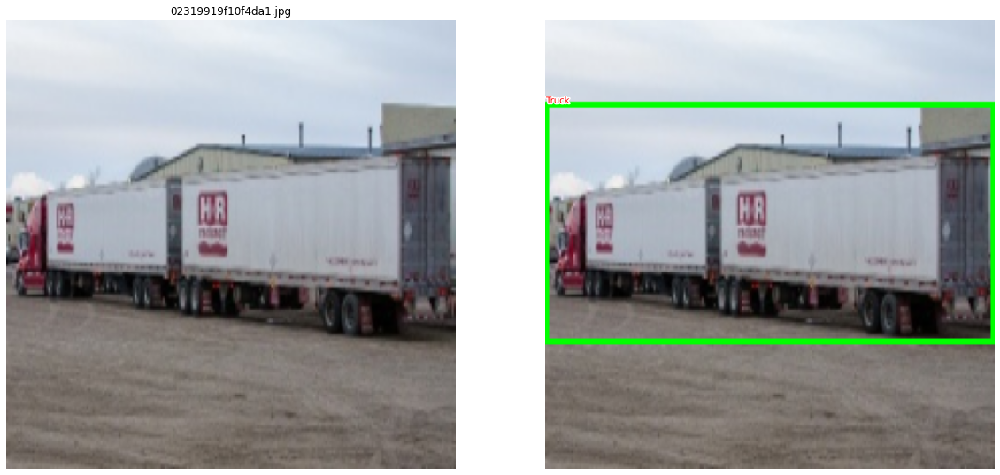

In [168]:
test_predictions(test_ds[44][-1])